In [1]:
#Import Dataset
import pandas as pd 

df = pd.read_csv('/Users/minemurakenji/Desktop/NLP/DatºaSets/english_news_dataset.csv')
df.head()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/minemurakenji/Desktop/NLP/DatºaSets/english_news_dataset.csv'

In [208]:
#Explode the data and duplicaet content if there are two or more categories
df = pd.DataFrame({
    'News Categories': df['News Categories'].apply(eval).explode(),
    'Headline': df['Headline'],
    'Content': df['Content']
})

In [209]:
df['News Categories'].unique()

array(['national', 'entertainment', 'politics', 'world', 'technology',
       'business', 'sports', 'Health___Fitness', 'startup', 'automobile',
       'fashion', 'science', 'cryptocurrency', 'Asia_Cup_2023',
       'Russia-Ukraine_Conflict', 'Coronavirus', 'education', 'travel',
       'miscellaneous', 'hatke', 'Asian_Games_2022', 'ODI_World_Cup_2023',
       'Israel-Hamas_War', 'facts', 'all', 'myfeed', 'metaverse',
       'policy', 'Hockey_World_Cup_2023', 'Feel_Good_Stories'],
      dtype=object)

In [210]:
#Remove unnecessary categories or categories that might cause complications
categories_to_remove = ['national','hatke','Asia_Cup_2023', 'Asian_Games_2022', 'ODI_World_Cup_2023','Israel-Hamas_War', 'facts', 'all', 'myfeed', 'metaverse','policy', 'Hockey_World_Cup_2023', 'Feel_Good_Stories','cryptocurrency','Russia-Ukraine_Conflict', 'Coronavirus','miscellaneous']
df = df.loc[~df['News Categories'].isin(categories_to_remove)]


<Axes: xlabel='News Categories'>

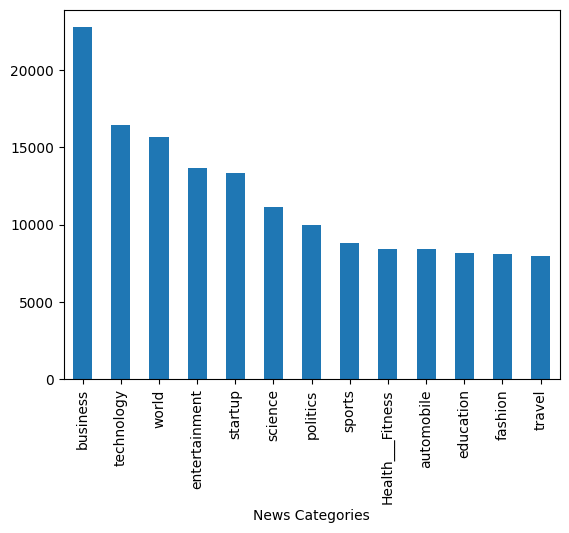

In [211]:
#Show Dataset 
df['News Categories'].value_counts().plot(kind='bar')

In [212]:
#Balance the dataset 
undersampled_data = pd.DataFrame(columns=['News Categories','Content'])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='business'].sample(8500)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='technology'].sample(8500)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='world'].sample(8500)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='entertainment'].sample(8500)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='startup'].sample(8500)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='science'].sample(8500)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='politics'].sample(8500)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='sports'].sample(8500)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='Health___Fitness'].sample(7000)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='automobile'].sample(7000)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='education'].sample(7000)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='fashion'].sample(7000)])
undersampled_data = pd.concat([undersampled_data, df[df['News Categories']=='travel'].sample(7000)])


df = undersampled_data
df.reset_index(inplace=True)

<Axes: xlabel='News Categories'>

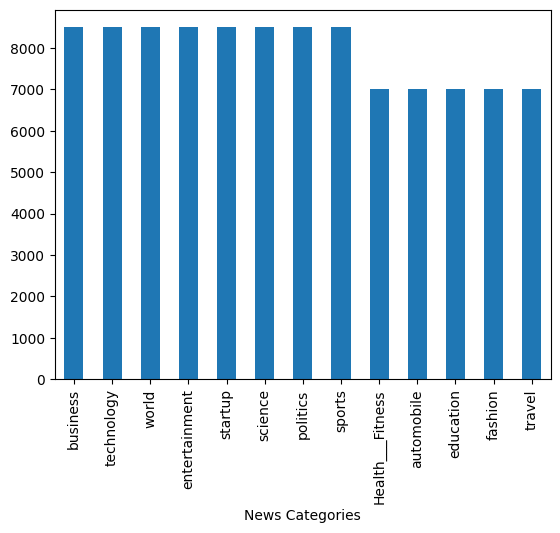

In [248]:
df['News Categories'].value_counts().plot(kind='bar')

In [213]:
#Funtion - text preprocessing and text vectorization
import re
import nltk
import numpy as np
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.stem.wordnet import WordNetLemmatizer
import spacy
nlp = spacy.load('en_core_web_lg')

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
stopwords_en = stopwords.words('english')
lemmatizer = WordNetLemmatizer()

def process_text(text):
    texto = text.lower()
    texto = re.sub(r'([^0-9A-Za-z \t])', '', texto)
    texto = word_tokenize(texto)
    texto = [palabra for palabra in texto if palabra not in stopwords_en]
    texto = [lemmatizer.lemmatize(palabra) for palabra in texto]
    texto = '  '.join(texto)
    return texto

def vectorize(text):
  text = nlp(text).vector
  return text

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/minemurakenji/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/minemurakenji/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/minemurakenji/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [214]:
#Apply text preprocessing
df['clean_content'] = df['Content'].apply(process_text)

In [215]:
#Apply text vectorization 
df['vector'] = df['clean_content'].apply(vectorize)
df.head()

,index,News Categories,Content,Headline,clean_content,vector
0,50059,business,Several banks in the US have asked their emplo...,US banks ask Israel staff to work from home am...,several bank u asked employee israel wor...,"[-0.5048646, 0.26265025, -0.9484738, 0.1082662..."
1,88403,business,CarDekho reported a 46.3% jump in its annual t...,CarDekho's FY23 revenue grows 46% on services ...,cardekho reported 463 jump annual total ...,"[-0.5836469, -0.23371026, -0.8968276, 0.714363..."
2,27280,business,Sudha Murty's assistant has filed a complaint ...,Sudha Murty files complaint after her name use...,sudha murtys assistant filed complaint be...,"[-0.66374123, -0.18446983, -0.3516283, -0.1905..."
3,90192,business,2023’s only unicorn has recorded a surge in it...,Beyond Zepto’s 14X Revenue Surge,2023s unicorn recorded surge revenue stor...,"[0.0835219, 0.5078452, -1.1530935, 0.3749384, ..."
4,6494,business,Workers have gathered outside Tata Steel's Por...,Protest erupts outside Tata Steel plant after ...,worker gathered outside tata steel port ...,"[0.009302625, -0.28980526, -1.5658637, 0.48727..."


In [289]:
#Funtion - Cosine similarity. Show top x similar Content 
def getTopXWords(word,n,df):
    data = {
        'words': [],
        'sims': []
    }

    word = process_text(word)
    word = vectorize(word)

    for vector, text in zip(df['vector'],df['Content']):

        data['words'].append(text)

        A = word
        B = vector
        res = np.dot(A,B)/(np.linalg.norm(A)*np.linalg.norm(B))

        data['sims'].append(res)

    df2 = pd.DataFrame(data).sort_values(by='sims',ascending=False).head(n)    

    return df2

In [295]:
getTopXWords('Science is dangarouse for US',10,df)

,words,sims
31611,Actor Mithun Chakraborty's son Namashi Chakrab...,0.584897
22265,Environmental lawyer and anti-vaccine activist...,0.583600
18015,Environmental lawyer and anti-vaccine activist...,0.583600
85452,The Times Higher Education released the World ...,0.583162
83895,The Times Higher Education released the World ...,0.583162
21196,The Times Higher Education released the World ...,0.583162
22310,The Times Higher Education released the World ...,0.583162
83172,The Times Higher Education released the World ...,0.583162
88997,The Times Higher Education released the World ...,0.583162
17497,The Times Higher Education released the World ...,0.583162


In [218]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from nltk.util import ngrams

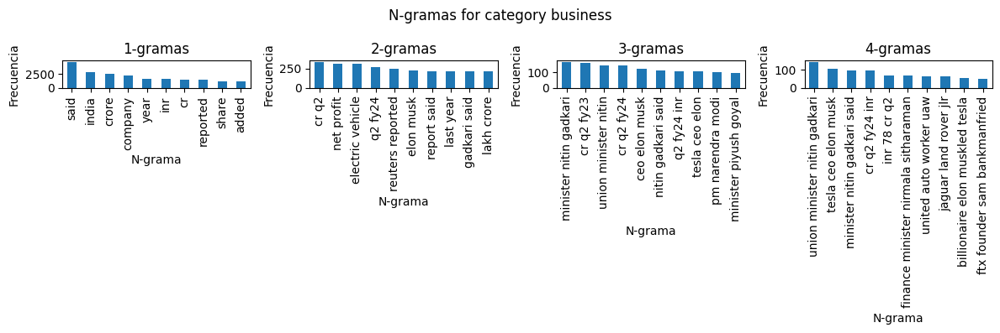

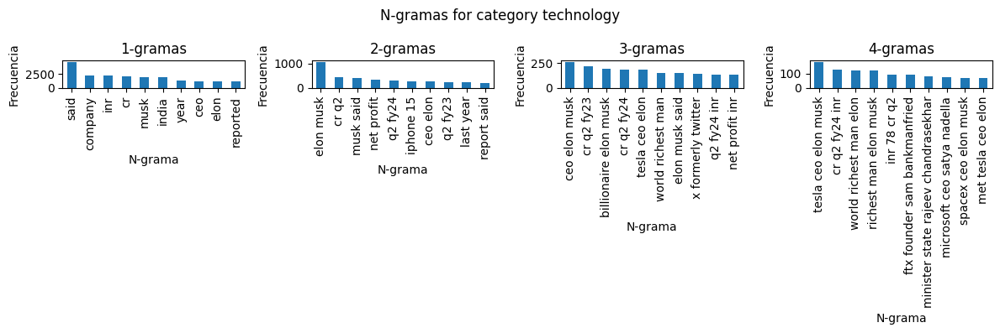

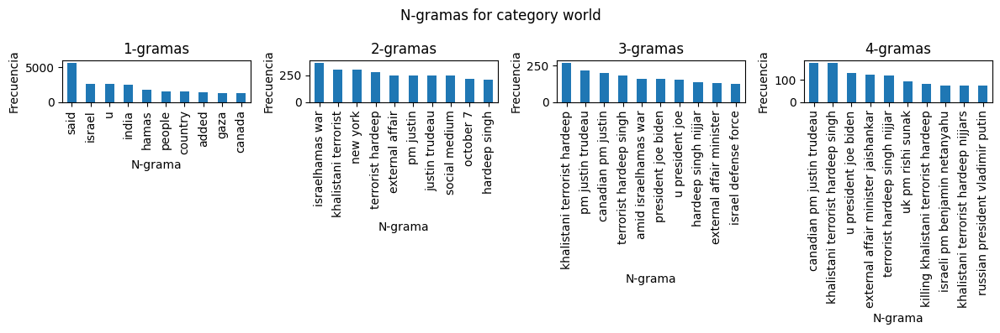

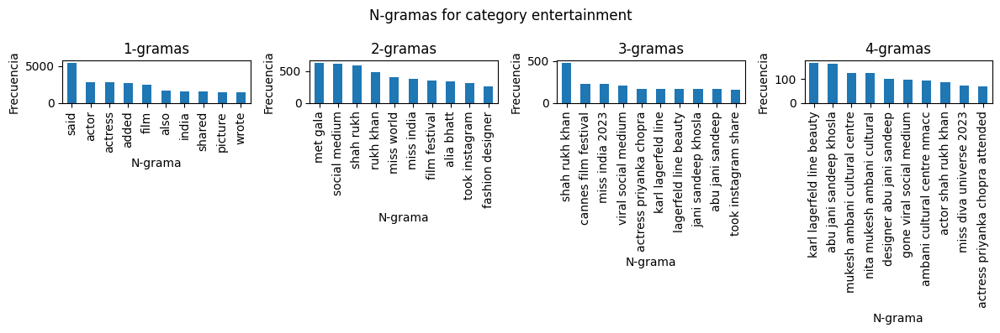

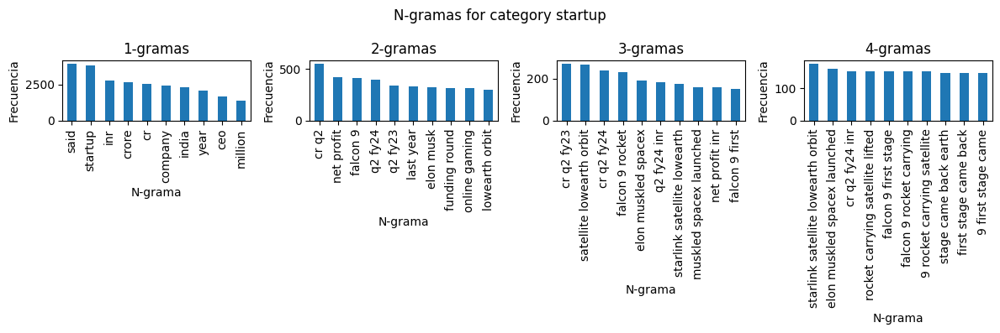

...

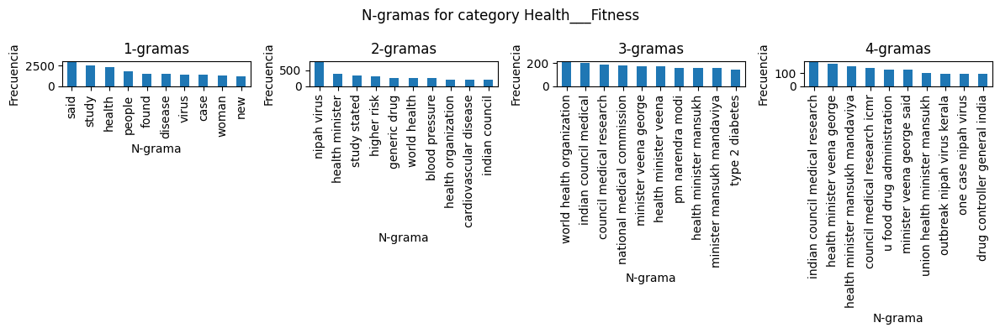

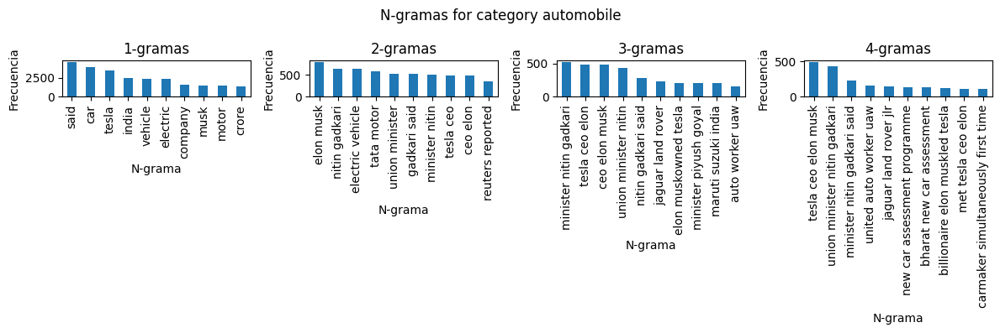

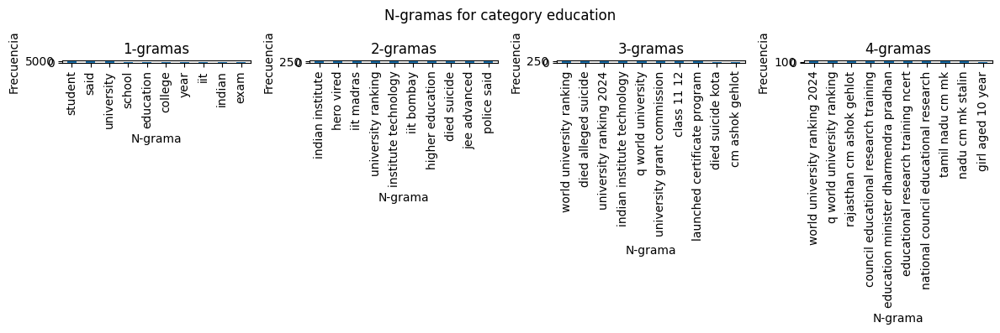

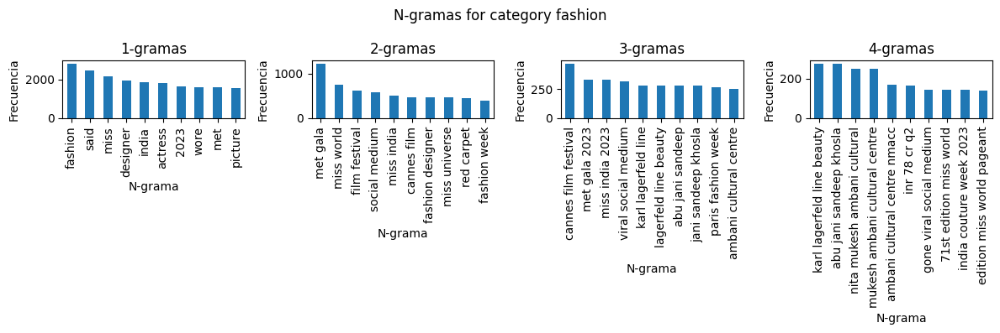

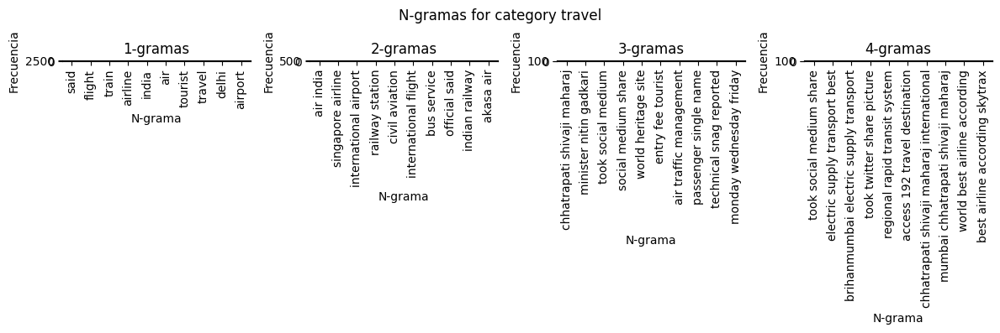

In [274]:
# Function to obtain n-grams
def get_ngrams(n, columna):
    vocab = []
    for texto in columna:
        n_grama = ngrams(word_tokenize(texto), n)
        for ngram in n_grama:
            resultado = " ".join(ngram)
            vocab.append(resultado)
    return pd.Series(vocab).value_counts()

# Generate graph for each category
categories = df['News Categories'].unique()
for category in categories:
    df_category = df[df['News Categories'] == category]
    plt.figure(figsize=(12, 4))
    plt.suptitle(f'N-gramas for category {category}')

    for i, n in enumerate([1, 2, 3, 4]):
        plt.subplot(1, 4, i+1)
        ngram_counts = get_ngrams(n, df_category['clean_content'])
        ngram_counts.head(10).plot(kind='bar')
        plt.title(f'{n}-gramas')
        plt.xlabel('N-grama')
        plt.ylabel('Frecuencia')

    plt.tight_layout()
    plt.show()

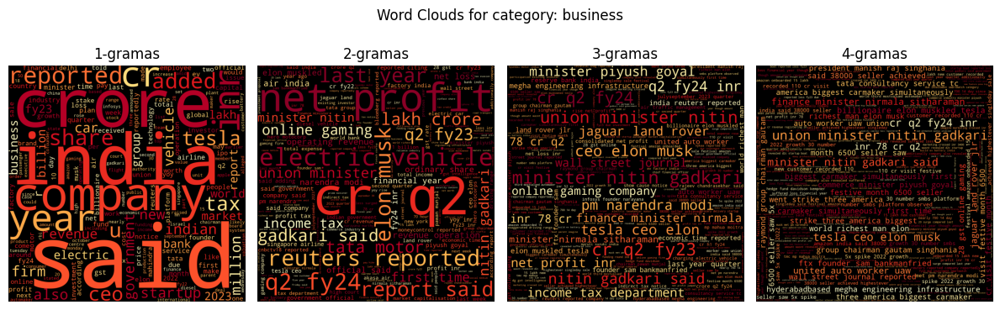

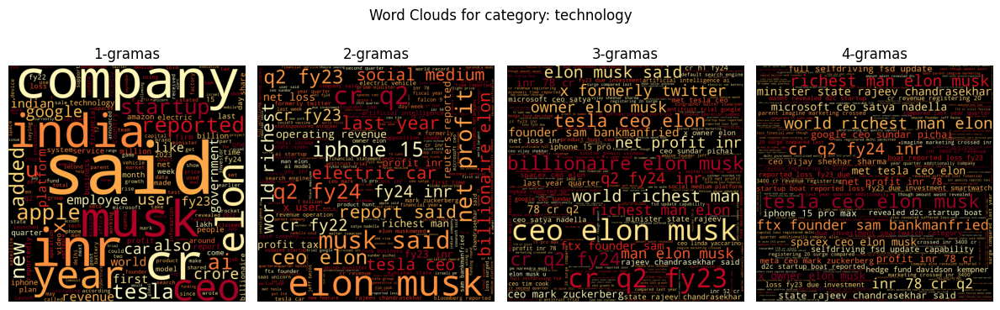

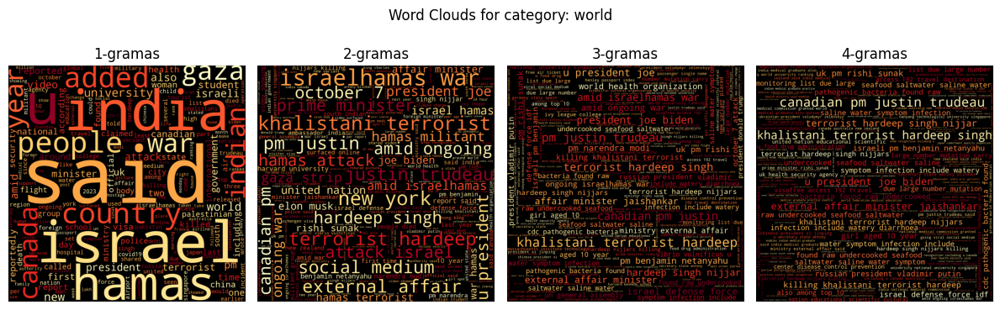

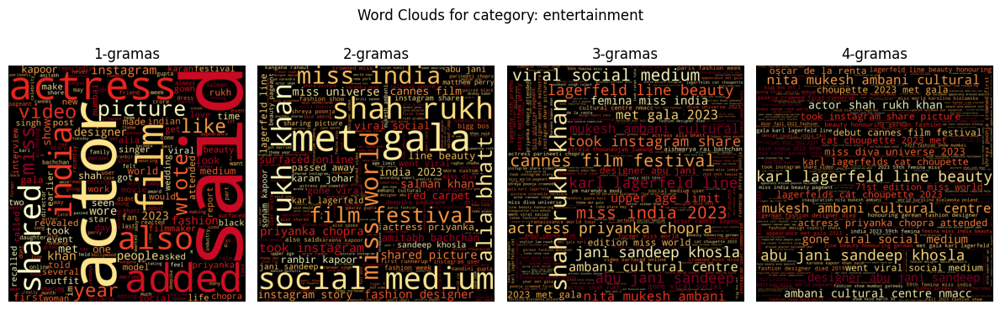

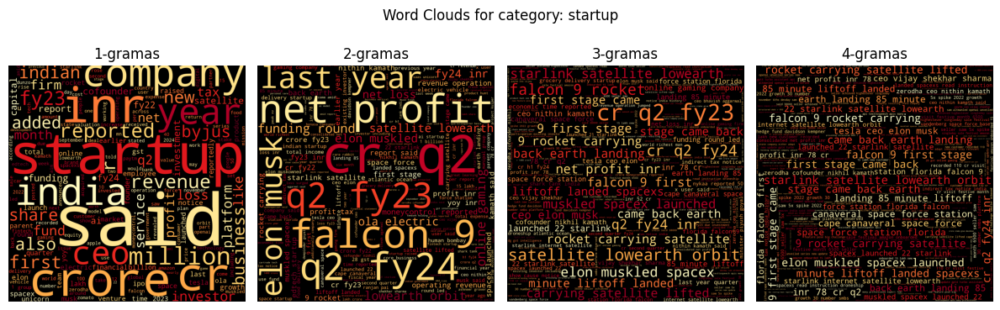

...

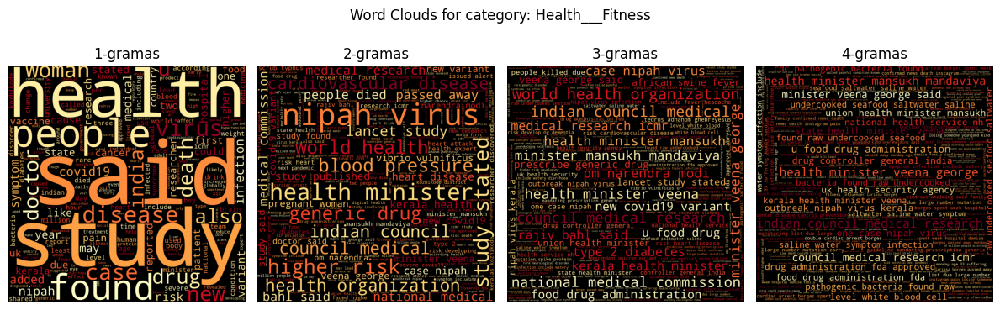

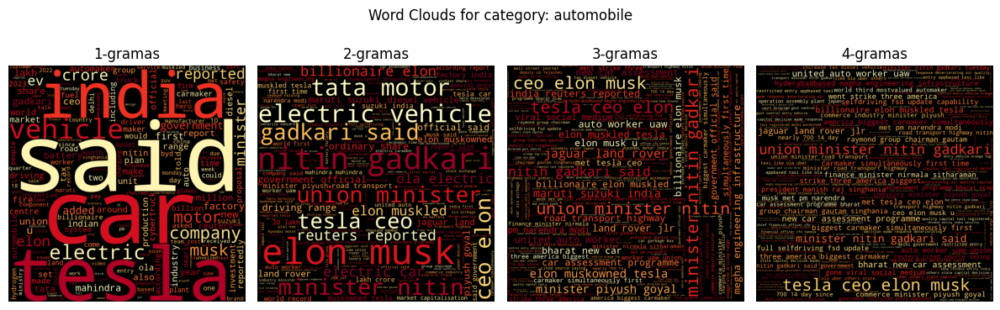

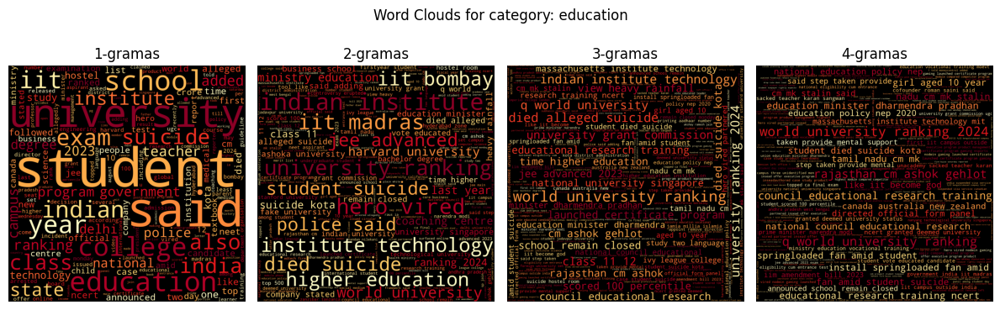

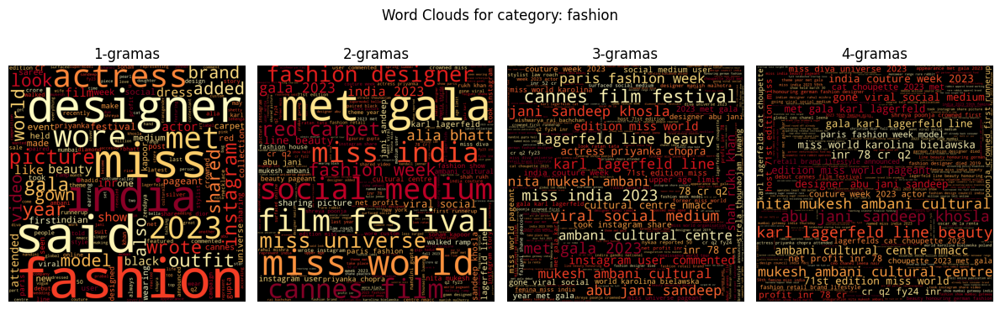

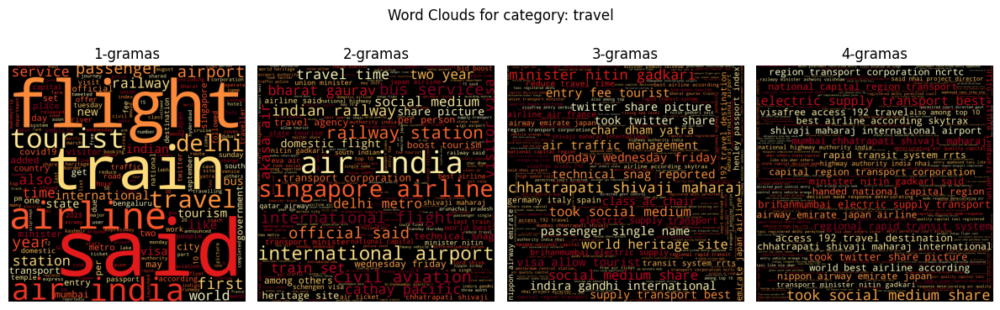

In [220]:
# Word clouds for each n-grams
for category in categories:
    df_category = df[df['News Categories'] == category]
    plt.figure(figsize=(12, 4))
    plt.suptitle(f'Word Clouds for category: {category}')

    for i, n in enumerate([1, 2, 3, 4]):
        plt.subplot(1, 4, i+1)
        ngram_counts = get_ngrams(n, df_category['clean_content'])
        wordcloud = WordCloud(
            width=1200,
            height=1200,
            colormap='YlOrRd',
            background_color='black',
            collocations=False,
            mask=None,  
            min_font_size=6
        ).generate_from_frequencies(ngram_counts)

        plt.imshow(wordcloud)
        plt.title(f'{n}-gramas')
        plt.axis("off")

    plt.tight_layout()
    plt.show()

In [221]:
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix

In [222]:
#Split the data into train and test 
from sklearn.model_selection import train_test_split

X = df['vector']
X = np.concatenate(X, axis=0).reshape(-1,300)
y = df['News Categories']

X_train, X_test, y_train, y_test = train_test_split(X,y,train_size = 0.7, random_state = 101)

In [223]:
#Preparing grids earch and cross validation  
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB

#For Logistic Regression
model_lr = LogisticRegression()

params_lr = {
    'solver':['ibfgs','liblinear'],
    'C':[1, 1.5],
}

grid_lr = GridSearchCV(estimator=model_lr,
                    param_grid=params_lr,
                    cv=10,
                    n_jobs=-1,
                    verbose=1,
                    scoring='accuracy')

#For Random Forest 
model_rfc = RandomForestClassifier()

params_rfc = {
    'n_estimators':[50,100],
    'criterion':['gini','entropy']
}

grid_rfc = GridSearchCV(estimator=model_rfc,
                    param_grid=params_rfc,
                    cv=10,
                    n_jobs=-1,
                    verbose=1,
                    scoring='accuracy')

#For Naive Bayes
model_nb = BernoulliNB()

params_nb = {
    'alpha':[0.5,1],
}
grid_nb = GridSearchCV(estimator=model_nb,
                       param_grid=params_nb,
                       cv=10,
                       n_jobs=-1,
                       verbose=1,
                       scoring='accuracy')

In [224]:
#Train for Random Forest
grid_rfc.fit(X_train,y_train)

Fitting 10 folds for each of 4 candidates, totalling 40 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'n_estimators': [50, 100]},
             scoring='accuracy', verbose=1)

In [296]:
#Train for Naive Bayes
grid_nb.fit(X_train,y_train)

Fitting 10 folds for each of 2 candidates, totalling 20 fits


GridSearchCV(cv=10, estimator=BernoulliNB(), n_jobs=-1,
             param_grid={'alpha': [0.5, 1]}, scoring='accuracy', verbose=1)

In [226]:
#Random Forest best parameters
grid_rfc.best_params_

{'criterion': 'entropy', 'n_estimators': 100}

In [227]:
#Random Forest accuracy
grid_rfc.best_score_

0.7451456310679612

In [228]:
#Naive Bayes accuracy
grid_nb.best_score_

0.5233009708737864

In [230]:
#Train the best model with the whole train set 
model = RandomForestClassifier(criterion='entropy',n_estimators=100)
model.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy')

In [231]:
#Testing the model
y_pred = model.predict(X_test)

In [232]:
#Showing perfromance metrics
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

                  precision    recall  f1-score   support

Health___Fitness       0.68      0.90      0.78      2135
      automobile       0.64      0.98      0.77      2093
        business       0.63      0.23      0.34      2567
       education       0.84      0.97      0.90      2098
   entertainment       0.84      0.59      0.69      2618
         fashion       0.62      0.94      0.75      2127
        politics       0.91      0.94      0.93      2605
         science       0.77      0.77      0.77      2581
          sports       0.92      0.95      0.94      2510
         startup       0.60      0.61      0.61      2533
      technology       0.58      0.44      0.50      2495
          travel       0.83      0.97      0.89      2001
           world       0.83      0.58      0.68      2537

        accuracy                           0.74     30900
       macro avg       0.75      0.76      0.73     30900
    weighted avg       0.75      0.74      0.73     30900



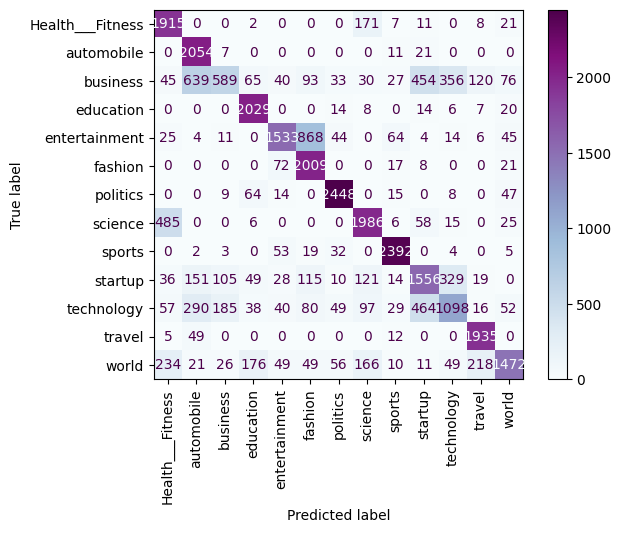

In [233]:
#Displaying confusion matrix 
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='BuPu', xticks_rotation='vertical')

In [253]:
#text to test the performance of the model 
test1 = 'Researchers Develop Breakthrough AI for Natural Language Understanding'
test2 = 'Underdog Team Shocks Fans with Unbelievable Comeback Victory'
test3 = 'Government Announces New Policies to Address Climate Change'
test4 = 'A-list Celebrities Gather for Premiere of Highly Anticipated Film'
test5 = 'Global Economic Trends in the Post-Pandemic Era'
test6 = 'Latest Developments in Space Exploration and Discovery'

In [266]:
#Function to predict a given text
def predict(text):
    print(text)
    text = process_text(text)
    text = vectorize(text)
    print(model.predict([text]))
    res = model.predict_proba([text])
    print(f'''
    Category.                 Probability
    =====================================================
    Health and Fitness:         {res[0][0]}
    Auto mobile:                {res[0][1]}
    Business:                   {res[0][2]}
    Education:                  {res[0][3]}
    Entertainment:              {res[0][4]}
    Fashion:                    {res[0][5]}
    Politics:                   {res[0][6]}
    Science:                    {res[0][7]}
    Sports:                     {res[0][8]}
    StartUp:                    {res[0][9]}
    Technology:                 {res[0][10]}
    Travel:                     {res[0][11]}
    World:                      {res[0][12]}

    ''')


In [267]:
predict(test1)

Researchers Develop Breakthrough AI for Natural Language Understanding
['technology']

    Category.                 Probability
    Health and Fitness:         0.11791907934429777
    Auto mobile:                0.022993109388458225
    Business:                   0.0807387564428473
    Education:                  0.06249234219886394
    Entertainment:              0.050125
    Fashion:                    0.015666666666666666
    Politics:                   0.07458333333333333
    Science:                    0.11995762123136132
    Sports:                     0.027894736842105264
    StartUp:                    0.09356347577128252
    Technology:                 0.17040120472341902
    Travel:                     0.01490909090909091
    World:                      0.14875558314827372

    


In [268]:
predict(test2)

Underdog Team Shocks Fans with Unbelievable Comeback Victory
['sports']

    Category.                 Probability
    Health and Fitness:         0.0
    Auto mobile:                0.0
    Business:                   0.009523809523809523
    Education:                  0.02
    Entertainment:              0.11557139699381076
    Fashion:                    0.006282051282051282
    Politics:                   0.01
    Science:                    0.015333333333333332
    Sports:                     0.7281465517241379
    StartUp:                    0.0006666666666666666
    Technology:                 0.01980952380952381
    Travel:                     0.01
    World:                      0.06466666666666666

    


In [269]:
predict(test3)

Government Announces New Policies to Address Climate Change
['world']

    Category.                 Probability
    Health and Fitness:         0.08587063286289409
    Auto mobile:                0.04233951756908084
    Business:                   0.1123548263216402
    Education:                  0.11206201321108153
    Entertainment:              0.033125
    Fashion:                    0.010833333333333332
    Politics:                   0.10274458874458875
    Science:                    0.034210526315789476
    Sports:                     0.007894736842105263
    StartUp:                    0.13623295842773403
    Technology:                 0.0881038827686425
    Travel:                     0.03
    World:                      0.20422798360310998

    


In [270]:
predict(test4)

A-list Celebrities Gather for Premiere of Highly Anticipated Film
['entertainment']

    Category.                 Probability
    Health and Fitness:         0.01
    Auto mobile:                0.0037209302325581393
    Business:                   0.022190031418983906
    Education:                  0.0
    Entertainment:              0.6081635145913242
    Fashion:                    0.08306281540605324
    Politics:                   0.03
    Science:                    0.03
    Sports:                     0.09752380952380953
    StartUp:                    0.026279069767441862
    Technology:                 0.02
    Travel:                     0.02
    World:                      0.049059829059829065

    


In [271]:
predict(test5)

Global Economic Trends in the Post-Pandemic Era
['science']

    Category.                 Probability
    Health and Fitness:         0.06662682863113897
    Auto mobile:                0.025750000000000002
    Business:                   0.11600963318971026
    Education:                  0.031730769230769236
    Entertainment:              0.06327630989699955
    Fashion:                    0.05344471352473203
    Politics:                   0.06
    Science:                    0.18188374125874127
    Sports:                     0.08
    StartUp:                    0.07261525892408245
    Technology:                 0.10166274534382623
    Travel:                     0.02
    World:                      0.127

    


In [272]:
predict(test6)

Latest Developments in Space Exploration and Discovery
['science']

    Category.                 Probability
    Health and Fitness:         0.0949210715886547
    Auto mobile:                0.04264794857250898
    Business:                   0.06832741779853288
    Education:                  0.055882352941176466
    Entertainment:              0.04
    Fashion:                    0.021654749744637387
    Politics:                   0.05
    Science:                    0.3860825867419754
    Sports:                     0.01
    StartUp:                    0.04957463884430176
    Technology:                 0.12134689610587472
    Travel:                     0.01
    World:                      0.049562337662337655

    


In [299]:
test = '''
In an era where travel has become synonymous with exploration, adventure seekers are turning their attention to lesser-known destinations that offer a unique and authentic experience. Breaking away from conventional tourist hotspots, intrepid travelers are setting their sights on remote gems that promise a journey off the beaten path.
'''

predict(test)


In an era where travel has become synonymous with exploration, adventure seekers are turning their attention to lesser-known destinations that offer a unique and authentic experience. Breaking away from conventional tourist hotspots, intrepid travelers are setting their sights on remote gems that promise a journey off the beaten path.

['world']

    Category.                 Probability
    Health and Fitness:         0.03
    Auto mobile:                0.014154761904761903
    Business:                   0.04934865056327321
    Education:                  0.01
    Entertainment:              0.1230718954248366
    Fashion:                    0.04719551282051282
    Politics:                   0.03769230769230769
    Science:                    0.12258490566037736
    Sports:                     0.05878787878787878
    StartUp:                    0.06974561994609164
    Technology:                 0.05257311320754718
    Travel:                     0.17387878787878785
    World:    

In [298]:
test = '''
In the ever-evolving landscape of global businessa, companies are demonstrating remarkable resilience in the face of challenges while embracing innovation to drive growth. As the world economy undergoes shifts, businesses are adapting strategies to stay agile and maintain a competitive edge.'''
predict(test)


In the ever-evolving landscape of global business, companies are demonstrating remarkable resilience in the face of challenges while embracing innovation to drive growth. As the world economy undergoes shifts, businesses are adapting strategies to stay agile and maintain a competitive edge.
['business']

    Category.                 Probability
    Health and Fitness:         0.05665598290598291
    Auto mobile:                0.0683033327307661
    Business:                   0.2782815053238815
    Education:                  0.025
    Entertainment:              0.033777777777777775
    Fashion:                    0.020427699284842143
    Politics:                   0.01
    Science:                    0.09714285714285716
    Sports:                     0.02
    StartUp:                    0.1832704837414866
    Technology:                 0.09371302234927761
    Travel:                     0.03287878787878788
    World:                      0.08054855086434033

    


In [302]:
test = '''In a groundbreaking development, scientists have unveiled new findings 
that shed light on previously undiscovered aspects of the human genome. 
The research, conducted by a collaborative team of experts, opens doors 
to a deeper understanding of genetic factors influencing health, diseases, and 
potential therapeutic interventions.
'''
predict(test)

In a groundbreaking development, scientists have unveiled new findings 
that shed light on previously undiscovered aspects of the human genome. 
The research, conducted by a collaborative team of experts, opens doors 
to a deeper understanding of genetic factors influencing health, diseases, and 
potential therapeutic interventions.

['science']

    Category.                 Probability
    Health and Fitness:         0.2546396282949348
    Auto mobile:                0.006923076923076923
    Business:                   0.03833379445983438
    Education:                  0.05112238930659983
    Entertainment:              0.021904761904761906
    Fashion:                    0.008095238095238095
    Politics:                   0.03
    Science:                    0.37956414576708253
    Sports:                     0.02
    StartUp:                    0.03482590326340326
    Technology:                 0.06903438774922149
    Travel:                     0.0
    World:                   

In [303]:
import joblib
joblib.dump(model,'RFC.joblib')

['RFC.joblib']